<h1 align="center">Analysis of the <b>ICOADS</b> dataset</h1>

<p align="center">
  <img src="https://img.shields.io/badge/python-3.12-blue.svg">
  <img src="https://img.shields.io/badge/numpy-2.2.4-orange.svg">
  <img src="https://img.shields.io/badge/torch-2.4.0-purple.svg">
  <img src="https://img.shields.io/badge/datasets-4.49.0-yellow.svg">
  <img src="https://img.shields.io/badge/dask-2025.5.1-teal.svg">
  <img src="https://img.shields.io/badge/LICENSE-CC0-darkgreen.svg"> 
  <!-- 
  More information about the license can be found in the LICENSE file of this repository.
  //
  The license can be found at the following page under the section "Data Licensing":
  //
  https://www.ncei.noaa.gov/archive#:~:text=Data%20Licensing,-From%20the%20NESDIS&text=Environmental%20data%20and%20information%20collected
  //
  The access to the licensing page was provided by the NOAA team 
  (Chunying Liu and Xungang Yin, 30.05.2025 at icoads@noaa.gov)
  Thanks for the support!
  -->

</p>

The [ICOADS](https://icoads.noaa.gov/) (International Comprehensive Ocean-Atmosphere Data Set) dataset is a comprehensive collection of ocean-atmosphere data ranging in the used subset from 1960 to 2014. The dataset includes various variables such as temperature, salinity, and wind speed. 

<h5 align="center">The ICOADS dataset contains six groups (subsets) ranging from group 3 to group 9 (Group 8 does not exist for download):</h5>

<div align="center">

| Group | Category | Variables |
|:-----:|:--------:|:---------:|
| **3** | Basic Ocean-Atmosphere | sea_surface_temp, air_temp, specific_humidity, rainfall_rate |
| **4** | Wind and Pressure | wind_speed, wind_u_component, wind_v_component, sea_level_pressure |
| **5** | Cloud and Wind Products | cloud_coverage, rainfall_amount, wind_stress_u, wind_stress_v |
| **6** | Temperature/Humidity Diffs | sea_air_temp_diff, temp_diff_wind, humidity_deficit, humidity_flux |
| **7** | Wind-Temp/Humidity Products | wind_u_temp, wind_v_temp, wind_u_humidity, wind_v_humidity |
| **9** | Moisture Flux/Turbulence | moisture_flux_u, moisture_flux_v, wind_cubed_b1, wind_cubed_b2 |

</div>

Since loading the entire dataset into memory is not realistic due to its size, the different groups will be analyzed separately.
Also some plots were created with matplotlib, while others were created with plotly for better interactivity. For very computationally intensive tasks, the matplotlib libary was favored.

Some cells may take up to two minutes to run, I recommend to run the notebook with *Run All* at the beginning to avoid waiting time.

Also note that the initial download of the huggingface dataset may take a while (the dataset has a size of about 4 GB)...


In [1]:
#pip install --upgrade pip
#pip install -r requirements.txt

In [ ]:
# importing the modules and helper functions
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import folium
import time

from scipy.stats import pearsonr, linregress
from scipy.interpolate import griddata
from scipy.spatial.distance import cdist
from scipy.signal import savgol_filter
from scipy.ndimage import gaussian_filter

from sklearn.neighbors import NearestNeighbors

import plotly.graph_objects as go
import plotly.express as px


from helpers.hf import load_dataset

In [3]:
NUM_PROC = 3
USE_GPU = False

SAMPLE_SIZE = 100000 # for some computations only 100k datapoints are useds

HUGGINFACE_KEY = "KEY"
HF_DATASET_PATH = r"C:\Users\leobe\OneDrive\Documents\KIK 4-Thinkpad-Behr\KI-Life-Sciences\notebook\hf_dataset_2\icoads_ENH_G3_hf_dataset"


The filtered dataset is available on the Huggingface Hub in this [repository](https://huggingface.co/datasets/ICoads/ICoads-Subset). This filtered dataset was created using custom scripts. 

<details>
<summary>More info on how the subset was created</summary>

The compressed data files can be found on the [Research Data Archive](https://amst-osdf-xcache01.es.net:8443/ncar/rda/d548001/msg300_1deg) of the NCAR (last accessed 28.05.2025). Using a custom extraction script the ``.tar`` files can be downloaded and the ``.gz`` subfiles extracted. 

The NCAR website provides a not so detailed description of the dataset and several FORTRAN / C-Shell scripts that can be found on [this](https://rda.ucar.edu/datasets/d548001/software/) site. The ``extraction.py`` script contains the scaling logic of the columns and the conversion to ``.parquet``. Since the scaling is based on one of the FORTRAN / C-Shell scripts, errors are possible. 

Both the FORTRAN / C-Shell and the ``extraction.py`` script can be found in the ``helpers/`` folder.



</details>


In [4]:
# longitude normalization from 0-360° to -180/+180°:

def normalize_longitude(lon):
    
    return lon - 360 if lon > 180 else lon

def normalize_batch(batch):
    """convert longitude from 0-360° format to -180/+180° format."""
    batch['longitude'] = [normalize_longitude(lon) for lon in batch['longitude']]
    return batch

In [5]:

g3_dataset = load_dataset(dataset_path=HF_DATASET_PATH, split="3")
g3_dataset = g3_dataset.map(normalize_batch, batched=True)

Loading HuggingFace dataset...
Loading split '3'...


<h2 align="center" id="general-info">General Data Information</h2>

In [6]:
print(f"Columns in Group 3: {g3_dataset.column_names}")

print(f"Entries: {len(g3_dataset)}")

print(f"Time range: {min(g3_dataset['year'])} - {max(g3_dataset['year'])}")

geographic_coverage_lat = (min(g3_dataset['longitude']), max(g3_dataset['longitude']))
geographic_coverage_lon = (min(g3_dataset['latitude']), max(g3_dataset['latitude']))

print(f"Geographic coverage: Latitude {geographic_coverage_lat}, Longitude {geographic_coverage_lon}")

Columns in Group 3: ['year', 'month', 'longitude', 'latitude', 'box_size_degrees', 'platform_id1', 'platform_id2', 'data_group', 'checksum', 'source_file', 'sea_surface_temp_tercile1', 'sea_surface_temp_median', 'sea_surface_temp_tercile3', 'sea_surface_temp_mean', 'air_temp_tercile1', 'air_temp_median', 'air_temp_tercile3', 'air_temp_mean', 'specific_humidity_tercile1', 'specific_humidity_median', 'specific_humidity_tercile3', 'specific_humidity_mean', 'rainfall_rate_tercile1', 'rainfall_rate_median', 'rainfall_rate_tercile3', 'rainfall_rate_mean', 'date_string']
Entries: 2204267
Time range: 1960 - 1969
Geographic coverage: Latitude (-179.0, 180.0), Longitude (-78.0, 89.0)


In [29]:
key_columns = ['year', 'month', 'longitude', 'latitude', 'sea_surface_temp_mean', 'air_temp_mean', 'specific_humidity_mean', 'rainfall_rate_mean']

g3_sample = g3_dataset.shuffle(seed=42).select(range(SAMPLE_SIZE))

g3_sample_10 = g3_sample.select(range(10)).to_pandas()[key_columns]

print("First 10 entries of the dataset (key variables):")
print(g3_sample_10.to_string(index=False))

First 10 entries of the dataset (key variables):
 year  month  longitude  latitude  sea_surface_temp_mean  air_temp_mean  specific_humidity_mean  rainfall_rate_mean
 1964      2      157.0      47.0                   2.28          -2.10                    3.27                92.7
 1965     11     -122.0      29.0                  18.60          16.97                    9.29                78.5
 1960     11       44.0     -35.0                  19.30          18.60                     NaN                72.2
 1968      2      143.0      26.0                  20.06          17.10                    7.77                63.2
 1962      5     -118.0     -20.0                  26.00          24.23                   14.12                75.7
 1964      6       19.0      58.0                  11.60          12.45                    7.80                89.6
 1960      4       19.0      54.0                   3.84           4.99                    5.05                79.5
 1960      7      155.0

<h2 align="center" id="group-3-basic">Group 3: Basic Ocean-Atmosphere</h2>

Group 3 variables represent fundamental ocean-atmosphere interactions that can be used as a starting point for climate modeling and weather prediction.
The group 3 contains the following variables: ``sea_surface_temp``, ``air_temp``, ``specific_humidity``, ``rainfall_rate``.
While both ``sea_surface_temp`` (SST) and ``air_temp`` are measured in degrees Celsius (°C), ``specific_humidity`` is expressed in grams of water vapor per kilogram of air (g/kg) and ``rainfall_rate`` is measured in millimeters per hour (mm/h).

<!-- TODO: what datatypes are humidity and rainfall rate -->

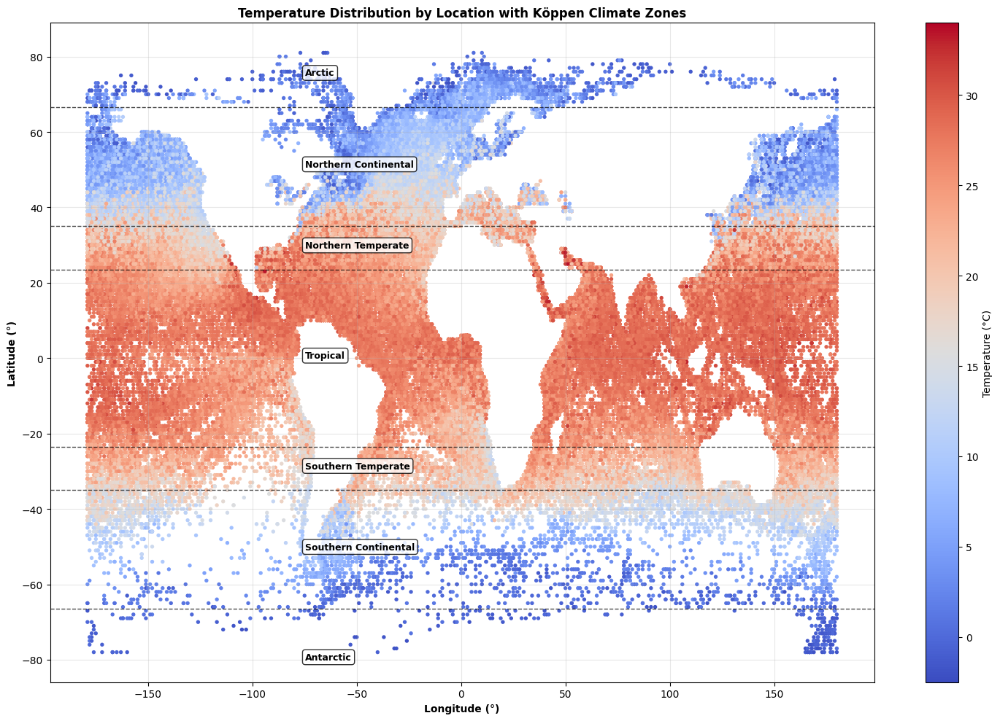

In [ ]:
plt.figure(figsize=(15, 10))

longitudes = g3_sample['longitude']
latitudes = g3_sample['latitude']
temperatures = g3_sample['sea_surface_temp_mean']

valid_temps = [t for t in temperatures if t is not None and -50 <= t <= 50]
valid_lats = [latitudes[i] for i, t in enumerate(temperatures) if t is not None and -50 <= t <= 50]
valid_lons = [longitudes[i] for i, t in enumerate(temperatures) if t is not None and -50 <= t <= 50]

scatter = plt.scatter(valid_lons, valid_lats, c=valid_temps, cmap='coolwarm', s=15, edgecolors='none')

climate_zones = [
    (-66.5, 'Polar Climate'),
    (-35, 'Continental Climate'), 
    (-23.5, 'Temperate Climate'),
    (23.5, 'Tropical Climate'),
    (35, 'Temperate Climate'),
    (66.5, 'Continental Climate')
]

for lat_boundary, zone_name in climate_zones:
    plt.axhline(y=lat_boundary, color='black', linestyle='--', alpha=0.7, linewidth=1)

zone_positions = [
    (-80, 'Antarctic'),
    ((-66.5 + -35) / 2, 'Southern Continental'),
    ((-35 + -23.5) / 2, 'Southern Temperate'),
    ((-23.5 + 23.5) / 2, 'Tropical'),
    ((23.5 + 35) / 2, 'Northern Temperate'),
    ((35 + 66.5) / 2, 'Northern Continental'),
    (75, 'Arctic')
]

for lat_pos, zone_label in zone_positions:
    plt.text(geographic_coverage_lon[0] + (geographic_coverage_lon[1] - geographic_coverage_lon[0]) * 0.02, lat_pos, zone_label, fontsize=9, fontweight='bold', bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.8))

plt.xlabel('Longitude (°)', fontweight='bold')
plt.ylabel('Latitude (°)', fontweight='bold')
plt.title('Temperature Distribution by Location with Köppen Climate Zones', fontweight='bold')
plt.grid(True, alpha=0.3)
plt.colorbar(scatter, label='Temperature (°C)')
plt.tight_layout()
plt.show()

<h3 align="center">Temperature Distribution by Climate Zones</h3>

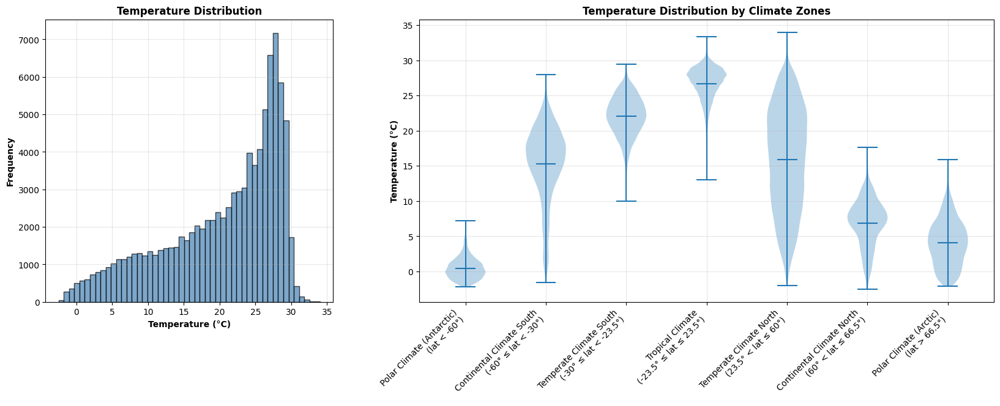

In [9]:
# temperature distribution histogram

valid_temps = [t for t in temperatures if t is not None and -50 <= t <= 50]

# Create figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6), gridspec_kw={'width_ratios': [1, 2]})

# Temperature distribution histogram
ax1.hist(valid_temps, bins=50, alpha=0.7, color='steelblue', edgecolor='black')
ax1.set_xlabel('Temperature (°C)', fontweight='bold')
ax1.set_ylabel('Frequency', fontweight='bold')
ax1.set_title('Temperature Distribution', fontweight='bold')
ax1.grid(True, alpha=0.3)

# Define proper climate zones based on Köppen classification
lat_zones = [
    'Polar Climate (Antarctic)\n(lat < -60°)',
    'Continental Climate South\n(-60° ≤ lat < -30°)', 
    'Temperate Climate South\n(-30° ≤ lat < -23.5°)',
    'Tropical Climate\n(-23.5° ≤ lat ≤ 23.5°)',
    'Temperate Climate North\n(23.5° < lat ≤ 60°)',
    'Continental Climate North\n(60° < lat ≤ 66.5°)',
    'Polar Climate (Arctic)\n(lat > 66.5°)'
]

zone_temps = []
zone_labels = []

for lat, temp in zip(valid_lats, valid_temps):
    if lat < -60:
        zone_temps.append([temp, 0])  # Polar South
    elif lat < -30:
        zone_temps.append([temp, 1])  # Continental South
    elif lat < -23.5:
        zone_temps.append([temp, 2])  # Temperate South
    elif lat <= 23.5:
        zone_temps.append([temp, 3])  # Tropical
    elif lat <= 60:
        zone_temps.append([temp, 4])  # Temperate North
    elif lat <= 66.5:
        zone_temps.append([temp, 5])  # Continental North
    else:
        zone_temps.append([temp, 6])  # Polar North

zone_data = [[] for _ in range(7)]
for temp, zone in zone_temps:
    zone_data[zone].append(temp)

filtered_data = []
filtered_labels = []
for i, data in enumerate(zone_data):
    filtered_data.append(data)
    filtered_labels.append(lat_zones[i])

violin_parts = ax2.violinplot(filtered_data, positions=range(len(filtered_data)), showmeans=True)
ax2.set_xticks(range(len(filtered_labels)))
ax2.set_xticklabels(filtered_labels, rotation=45, ha='right')
ax2.set_ylabel('Temperature (°C)', fontweight='bold')
ax2.set_title('Temperature Distribution by Climate Zones', fontweight='bold')
ax2.grid(True, alpha=0.3)

<h4 align="center"><b>Temperature Distribution by Climate Zones</b></h4>

The violin plot reveals the distinct temperature patterns across the different climate zones, with each zone displaying characteristic ranges and distributions that reflect their underlying oceanographic and atmospheric conditions.

The **tropical climate zone** (*-23.5° ≤ lat ≤ 23.5°*) shows the highest median temperatures around 27-28°C with a relatively narrow distribution, consistent with the fairly stable, warm conditions expected near the equator. In contrast, the **polar climate zones** exhibit the lowest temperatures with slightly broader distributions, reflecting the colder and moderately variable conditions at high latitudes.

A particularly noticable feature is the **substantial difference** between **northern and southern temperate zones**. The **Northern Temperate Climate** (23.5° < lat ≤ 60°) displays a much wider temperature distribution compared to its **Southern Temperate** counterpart (-30° ≤ lat < -23.5°). This asymmetry can be attributed to several factors: the Northern Hemisphere contains a more diverse ocean environment with varying thermal characteristics, including the warm Gulf Stream and cold Arctic waters. Additionally, the greater land-ocean contrast in the north creates more pronounced seasonal temperature variations, while the Southern Hemisphere's more uniform oceanic environment produces more stable temperatures. (Source: [AMS](https://journals.ametsoc.org/view/journals/clim/26/12/jcli-d-12-00262.1.xml))

The **continental climate zones** show intermediate temperature ranges with notable variability, reflecting their position between temperate and polar regions. This distribution pattern shows how "*regional*" oceanographic features like the mentioned ocean currents can fundamentally shape the global temperature patterns in marine environments.

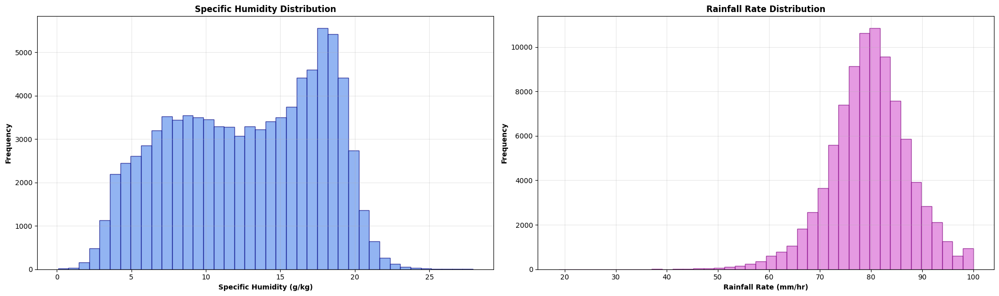

In [10]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))

humidity_data = [h for h in g3_sample['specific_humidity_mean'] if h is not None and 0 <= h]
rainfall_data = [r for r in g3_sample['rainfall_rate_mean'] if r is not None and 0 <= r]

ax1.hist(humidity_data, bins=40, alpha=0.7, color='cornflowerblue', edgecolor='navy')
ax1.set_xlabel('Specific Humidity (g/kg)', fontweight='bold')
ax1.set_ylabel('Frequency', fontweight='bold')
ax1.set_title('Specific Humidity Distribution', fontweight='bold')
ax1.grid(True, alpha=0.3)

ax2.hist(rainfall_data, bins=40, alpha=0.7, color='orchid', edgecolor='purple')
ax2.set_xlabel('Rainfall Rate (mm/hr)', fontweight='bold')
ax2.set_ylabel('Frequency', fontweight='bold')
ax2.set_title('Rainfall Rate Distribution', fontweight='bold')
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

<h2 align="center" id="group-4">Group 4: Wind and Pressure</h2>

Group 4 variables represent the atmospheric conditions.
The group contains the following variables: ``wind_speed``, ``wind_u_component``, ``wind_v_component``, ``sea_level_pressure``.
While both ``wind_u_component`` and ``wind_v_component`` are measured in meters per second (m/s), the ``sea_level_pressure`` (SLP) is expressed in hectopascals (hPa) and the ``rainfall_rate`` is measured in millimeters per hour (mm/h).



<h3 align="center">Distribution of Wind Direction and Speed</h3>

Loading HuggingFace dataset...
Loading split '4'...


Filter:   0%|          | 0/100000 [00:00<?, ? examples/s]

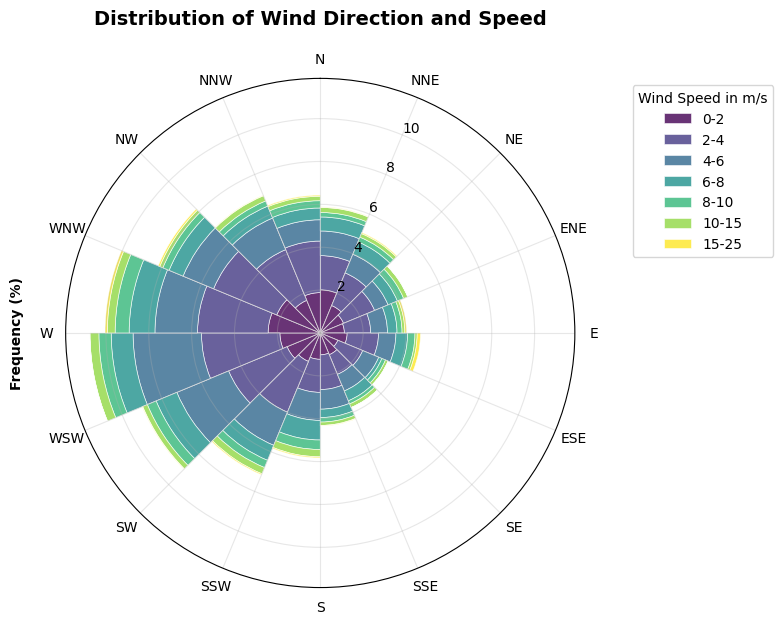

Wind Analysis Statistics:
Total valid wind measurements: 3,825
Mean wind speed: 4.10 m/s
Median wind speed: 3.44 m/s
Max wind speed: 25.70 m/s
Most common wind direction: WSW (258.8°)


In [11]:
g4_dataset = load_dataset(dataset_path=HF_DATASET_PATH, split="4")
g4_dataset = g4_dataset.map(normalize_batch, batched=True)
g4_sample = g4_dataset.shuffle(seed=42).select(range(SAMPLE_SIZE))

fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='polar')

# filter for western europe
def western_europe(example):
    return (
        (example['longitude'] >= -10) and (example['longitude'] <= 25) and
        (example['latitude'] >= 35) and (example['latitude'] <= 70)
    )

g4_sample_europe = g4_sample.filter(western_europe)

wind_u = np.array([u for u in g4_sample_europe['wind_u_component_mean'] if u is not None])
wind_v = np.array([v for v in g4_sample_europe['wind_v_component_mean'] if v is not None])

min_len = min(len(wind_u), len(wind_v))
wind_u = wind_u[:min_len]
wind_v = wind_v[:min_len]

wind_speed = np.sqrt(wind_u**2 + wind_v**2)
wind_direction = np.arctan2(-wind_v, -wind_u) * 180 / np.pi
wind_direction = (90 - wind_direction) % 360

# Filter out extreme values
valid_mask = (wind_speed >= 0) & (wind_speed <= 30) & ~np.isnan(wind_direction)
wind_speed = wind_speed[valid_mask]
wind_direction = wind_direction[valid_mask]

# Define direction bins (16 compass directions)
dir_bins = np.arange(0, 361, 22.5)
dir_centers = np.arange(11.25, 360, 22.5)
dir_labels = ['N', 'NNE', 'NE', 'ENE', 'E', 'ESE', 'SE', 'SSE', 'S', 'SSW', 'SW', 'WSW', 'W', 'WNW', 'NW', 'NNW']

# Define speed bins
speed_bins = [0, 2, 4, 6, 8, 10, 15, 25]
speed_labels = ['0-2', '2-4', '4-6', '6-8', '8-10', '10-15', '15-25']
colors = plt.cm.viridis(np.linspace(0, 1, len(speed_labels)))

# Calculate frequency for each direction and speed bin
for i, (speed_start, speed_end) in enumerate(zip(speed_bins[:-1], speed_bins[1:])):
    speed_mask = (wind_speed >= speed_start) & (wind_speed < speed_end)
    
    if np.any(speed_mask):
        dir_hist, _ = np.histogram(wind_direction[speed_mask], bins=dir_bins)
        frequency = dir_hist / len(wind_direction) * 100  # Convert to percentage
        
        # Plot bars for this speed range
        theta = np.deg2rad(dir_centers)
        bottom = np.sum([np.histogram(wind_direction[(wind_speed >= speed_bins[j]) & 
                                                   (wind_speed < speed_bins[j+1])], 
                                    bins=dir_bins)[0] / len(wind_direction) * 100 
                        for j in range(i)], axis=0)
        
        bars = ax.bar(theta, frequency, width=np.deg2rad(22.5), 
                     bottom=bottom, label=speed_labels[i], 
                     color=colors[i], alpha=0.8, edgecolor='white', linewidth=0.5)

# Customize the plot
ax.set_theta_zero_location('N')
ax.set_theta_direction(-1)
ax.set_thetagrids(np.arange(0, 360, 22.5), labels=dir_labels)

# Set radial limits and labels
ax.set_ylim(0, np.max([np.histogram(wind_direction, bins=dir_bins)[0].max() / len(wind_direction) * 100]) * 1.1)
ax.set_ylabel('Frequency (%)', labelpad=30, fontweight='bold')
ax.grid(True, alpha=0.3)

# Add legend
ax.legend(loc='upper left', bbox_to_anchor=(1.1, 1.0), title='Wind Speed in m/s')

plt.title('Distribution of Wind Direction and Speed', 
          fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Print wind statistics
print(f"Wind Analysis Statistics:")
print(f"Total valid wind measurements: {len(wind_speed):,}")
print(f"Mean wind speed: {np.mean(wind_speed):.2f} m/s")
print(f"Median wind speed: {np.median(wind_speed):.2f} m/s")
print(f"Max wind speed: {np.max(wind_speed):.2f} m/s")
print(f"Most common wind direction: {dir_labels[np.argmax(np.histogram(wind_direction, bins=dir_bins)[0])]} ({dir_centers[np.argmax(np.histogram(wind_direction, bins=dir_bins)[0])]:.1f}°)")

<h4 align="center"><b>Distribution of Wind Direction and Speed</b></h4>

The ``wind speed`` and ``wind direction`` variables are derived from the u and v components from the dataset. <br>
The ``wind speed`` is calculated as follows:

$$
\text{wind\_speed} = \sqrt{u^2 + v^2}
$$
The ``wind direction`` is calculated by first determining the angle with respect to the Cartesian axes using the arctangent function:

$$
\theta = \arctan2(-v, -u) \cdot \frac{180}{\pi}
$$

This agnle is then converted to a compass bearing (0° = North, 90° = East...):

$$
\text{wind\_direction} = (90^\circ - \theta) \bmod 360^\circ
$$

The wind rose shows distinct patterns in the Western European wind climatology, with noticable directional preferences that possibly reflect Europes position within the North Atlantic storm track and the influence of large-scale atmospheric circulation patterns.

The most prominent feature is the strong **westerly component**, with winds from the **southwest (SW) over the west (W) to the northwest (NW)** sectors accounting for the majority of observation. These results are expected given the 
This westerly dominance is characteristic of the **mid-latitude westerlies** that govern Western Europe's climate, driven by the pressure gradient between the Icelandic Low and Azores High pressure systems.

This pressure gradient can be seen in the North Atlantic Oscillation (NAO), which is a major driver of interannual climate variability in the North Atlantic region. One of the main features of the NAO is the strong westerly winds that transport large air masses from the Atlantic Ocean towards Europe, influencing european weather patterns. 

The North Atlantic pressure gradient is visualized in the following plot.


Loading HuggingFace dataset...
Loading split '4'...


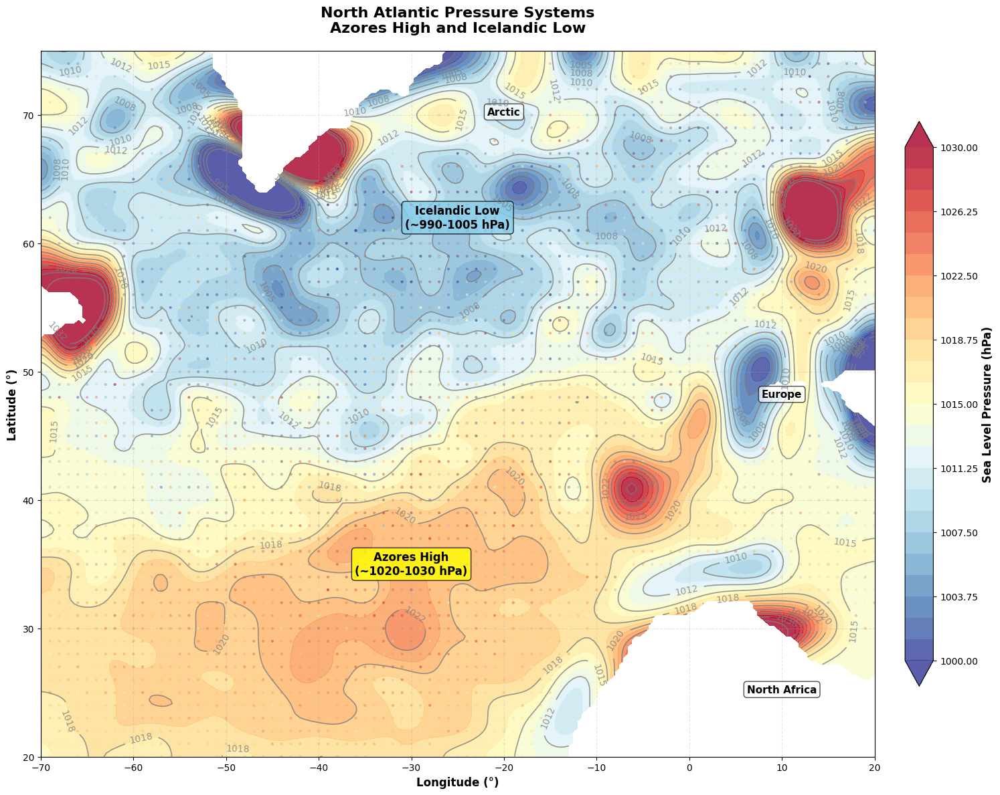

In [12]:
#g4_dataset = load_dataset(dataset_path=HF_DATASET_PATH, split="4")
#g4_dataset = g4_dataset.map(normalize_batch, batched=True)
#g4_sample = g4_dataset.shuffle(seed=42).select(range(SAMPLE_SIZE))

df_g4 = g4_sample.to_pandas()

north_atlantic_mask = (
    (df_g4['longitude'] >= -70) & (df_g4['longitude'] <= 20) &  # east-west
    (df_g4['latitude'] >= 20) & (df_g4['latitude'] <= 75) &     # north-south
    (df_g4['sea_level_pressure_mean'].notna()) &                # must have pressure data
    (df_g4['sea_level_pressure_mean'] >= 960) &                 # removing extreme outliers
    (df_g4['sea_level_pressure_mean'] <= 1050)                  # removing extreme outliers
)

lons = df_g4.loc[north_atlantic_mask, 'longitude'].values
lats = df_g4.loc[north_atlantic_mask, 'latitude'].values
pressures = df_g4.loc[north_atlantic_mask, 'sea_level_pressure_mean'].values

fig = plt.figure(figsize=(16, 12))
ax = fig.add_subplot(111)

data_points = np.column_stack([lons, lats])

neighbor_threshold = 2.0 
min_neighbors = 2
nbrs = NearestNeighbors(n_neighbors=min_neighbors+1, radius=neighbor_threshold).fit(data_points)
distances, indices = nbrs.radius_neighbors(data_points, radius=neighbor_threshold)

connected_points_mask = np.array([len(dist) >= min_neighbors for dist in distances])

connected_lons = lons[connected_points_mask]
connected_lats = lats[connected_points_mask]
connected_pressures = pressures[connected_points_mask]

lon_grid = np.linspace(-70, 20, 200)
lat_grid = np.linspace(20, 75, 200)
lon_mesh, lat_mesh = np.meshgrid(lon_grid, lat_grid)

pressure_interpolated = griddata(
    (connected_lons, connected_lats), 
    connected_pressures, 
    (lon_mesh, lat_mesh), 
    method='cubic',
    fill_value=np.nan
)    

valid_mask = ~np.isnan(pressure_interpolated)

# gaussian smoothing (necessary due to fragmentation)
if np.any(valid_mask):
    pressure_smoothed = pressure_interpolated.copy()
    
    pressure_smoothed = gaussian_filter(
        np.nan_to_num(pressure_interpolated, nan=np.nanmean(pressure_interpolated)), 
        sigma=4.0  # smoothing factor
    )
else:
    pressure_smoothed = pressure_interpolated

grid_points = np.column_stack([lon_mesh.ravel(), lat_mesh.ravel()])
connected_data_points = np.column_stack([connected_lons, connected_lats])

distances_to_connected = cdist(grid_points, connected_data_points)
min_distances_to_connected = np.min(distances_to_connected, axis=1)

max_interpolation_distance = 4.0 
interpolation_mask = min_distances_to_connected <= max_interpolation_distance
interpolation_mask = interpolation_mask.reshape(lon_mesh.shape)

pressure_interpolated_masked = np.where(interpolation_mask, pressure_interpolated, np.nan)

pressure_final = np.where(interpolation_mask, pressure_smoothed, np.nan)

contour_filled = ax.contourf(
    lon_mesh, lat_mesh, pressure_final,
    levels=np.linspace(1000, 1030, 25), # 25 gradient levels
    cmap='RdYlBu_r',
    alpha=0.8,
    extend='both' 
)

contour_lines = ax.contour(
    lon_mesh, lat_mesh, pressure_final,
    levels=np.arange(995, 1035, 2.5), 
    colors='gray',
    linewidths=1.2,
    alpha=0.8
)

# contour labels for isobars
plt.clabel(contour_lines, inline=True, fontsize=10, fmt='%1.0f', inline_spacing=8)

ax.scatter(
    connected_lons, connected_lats,
    c=connected_pressures, 
    cmap='RdYlBu_r',
    s=8, alpha=0.3, edgecolors='none',
    vmin=1000, vmax=1030
)

ax.set_xlim(-70, 20)
ax.set_ylim(20, 75)

cbar = plt.colorbar(contour_filled, ax=ax, shrink=0.8, pad=0.03)
cbar.set_label('Sea Level Pressure (hPa)', fontweight='bold', fontsize=12)

ax.set_title('North Atlantic Pressure Systems\nAzores High and Icelandic Low', fontweight='bold', fontsize=16, pad=20)
ax.set_xlabel('Longitude (°)', fontweight='bold', fontsize=12)
ax.set_ylabel('Latitude (°)', fontweight='bold', fontsize=12)

ax.grid(True, alpha=0.3, linestyle='--')

ax.text(-30, 35, 'Azores High\n(~1020-1030 hPa)', fontsize=12, fontweight='bold', ha='center', va='center', bbox=dict(boxstyle="round,pad=0.3", facecolor='yellow', alpha=0.8))
ax.text(-25, 62, 'Icelandic Low\n(~990-1005 hPa)', fontsize=12, fontweight='bold', ha='center', va='center', bbox=dict(boxstyle="round,pad=0.3", facecolor='skyblue', alpha=0.8))

ax.text(10, 48, 'Europe', fontsize=11, fontweight='bold', ha='center', bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.7))
ax.text(-20, 70, 'Arctic', fontsize=11, fontweight='bold', ha='center', bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.7))
ax.text(10, 25, 'North Africa', fontsize=11, fontweight='bold', ha='center', bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.7))


plt.tight_layout()
plt.show()

EXPLANATION!!


... The smaller, local high and low pressure areas ...

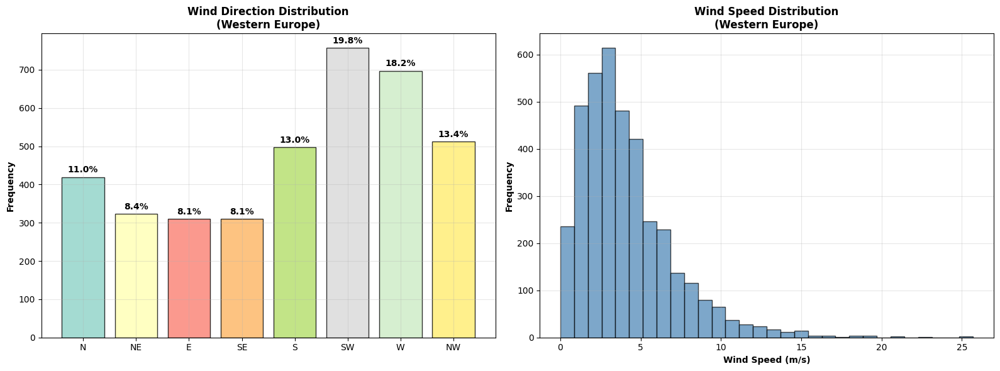

=== WIND ANALYSIS SUMMARY ===
Most common wind direction: SW (19.8%)
Average wind speed: 4.1 m/s
Strongest winds typically from: S


In [13]:
# Simple and clean wind direction analysis
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Calculate wind direction from components
wind_direction = (np.arctan2(wind_v, wind_u) * 180 / np.pi + 180) % 360
wind_direction = (90 - wind_direction) % 360  # Convert to meteorological convention

# 1. Wind Direction Histogram (8 main directions)
dir_bins_simple = [0, 45, 90, 135, 180, 225, 270, 315, 360]
dir_labels_simple = ['N', 'NE', 'E', 'SE', 'S', 'SW', 'W', 'NW']

hist, _ = np.histogram(wind_direction, bins=dir_bins_simple)
colors = plt.cm.Set3(np.linspace(0, 1, len(dir_labels_simple)))

bars = ax1.bar(dir_labels_simple, hist, color=colors, alpha=0.8, edgecolor='black')
ax1.set_ylabel('Frequency', fontweight='bold')
ax1.set_title('Wind Direction Distribution\n(Western Europe)', fontweight='bold')
ax1.grid(True, alpha=0.3)

# Add percentage labels on bars
for bar, count in zip(bars, hist):
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height + 0.01*max(hist),
            f'{count/len(wind_direction)*100:.1f}%', 
            ha='center', va='bottom', fontweight='bold')

# 2. Wind Speed Distribution
ax2.hist(wind_speed, bins=30, alpha=0.7, color='steelblue', edgecolor='black')
ax2.set_xlabel('Wind Speed (m/s)', fontweight='bold')
ax2.set_ylabel('Frequency', fontweight='bold')
ax2.set_title('Wind Speed Distribution\n(Western Europe)', fontweight='bold')
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Print clear statistics
print("=== WIND ANALYSIS SUMMARY ===")
print(f"Most common wind direction: {dir_labels_simple[np.argmax(hist)]} ({np.max(hist)/len(wind_direction)*100:.1f}%)")
print(f"Average wind speed: {np.mean(wind_speed):.1f} m/s")
print(f"Strongest winds typically from: {dir_labels_simple[np.argmax([np.mean(wind_speed[(wind_direction >= dir_bins_simple[i]) & (wind_direction < dir_bins_simple[i+1])]) for i in range(len(dir_bins_simple)-1)])]}")

<h2 align="center">Correlation Analysis</h2>

After visualizing the data of groups three and four the correlation between key variables are computed using the Pearson correlation analysis. Correlation analysis returns values ranging from -1 (perfect negative correlation) to +1 (perfect positive correlation), with 0 indicating no linear relationship. Due to computation time reasons the sample correlation coefficient was used, which estimates the true (population) Pearson correlation coefficient $\rho$ using sample data. The sample correlation coefficient is defined as:

$$
r = \frac{s_{x,y}}{s_x s_y}
  = \frac{\sum (x_i - \bar{x})(y_i - \bar{y})}
         {\sqrt{\sum (x_i - \bar{x})^2} \sqrt{\sum (y_i - \bar{y})^2}}
$$

The Pearson correlation coefficient ($r$) measures the degree to which two variables move in relation to each other. A high positive correlation suggests that as one variable increases, the other tends to increase as well. Conversely, a negative correlation indicates that as one variable increases, the other tends to decrease.

In [14]:
g3_sample = g3_dataset.shuffle(seed=42).select(range(SAMPLE_SIZE))

df = g3_sample.to_pandas()

mask1 = (df['sea_surface_temp_mean'].notna()) & (df['air_temp_mean'].notna()) & \
        (df['sea_surface_temp_mean'] >= -5) & (df['sea_surface_temp_mean'] <= 35) & \
        (df['air_temp_mean'] >= -5) & (df['air_temp_mean'] <= 35)

sst_data = df.loc[mask1, 'sea_surface_temp_mean'].values
air_temp_data = df.loc[mask1, 'air_temp_mean'].values

r_temp, _ = pearsonr(sst_data, air_temp_data)
print(f"Sea Surface Temperature vs Air Temperature: r = {r_temp:.4f}")

mask2 = (df['specific_humidity_mean'].notna()) & (df['sea_surface_temp_mean'].notna()) & \
        (df['specific_humidity_mean'] >= 0) & (df['specific_humidity_mean'] <= 30) & \
        (df['sea_surface_temp_mean'] >= -5) & (df['sea_surface_temp_mean'] <= 35)

humidity_data = df.loc[mask2, 'specific_humidity_mean'].values
temp_data = df.loc[mask2, 'sea_surface_temp_mean'].values

r_humid, _ = pearsonr(humidity_data, temp_data)
print(f"Specific Humidity vs Sea Surface Temperature: r = {r_humid:.4f}")

Sea Surface Temperature vs Air Temperature: r = 0.9828
Specific Humidity vs Sea Surface Temperature: r = 0.9287


The extremely strong positive correlation of $r ≈ 0.98$ for the Sea Surface Temperature and the Air Temperature shows that these two variables are almost perfectly linked. This relationship is expected as the two variables directly influence each other through heat exchange processes. 

The also very high positive correlation of $r ≈ 0.92$ between the Specific Humidity and the Sea Surface Temperature indicates a strong relationship as well. This linkage suggests that as sea surface temperatures rise, the amount of moisture in the atmosphere also increases significantly. 

For visualization of the correlations two scatter plots are created below:

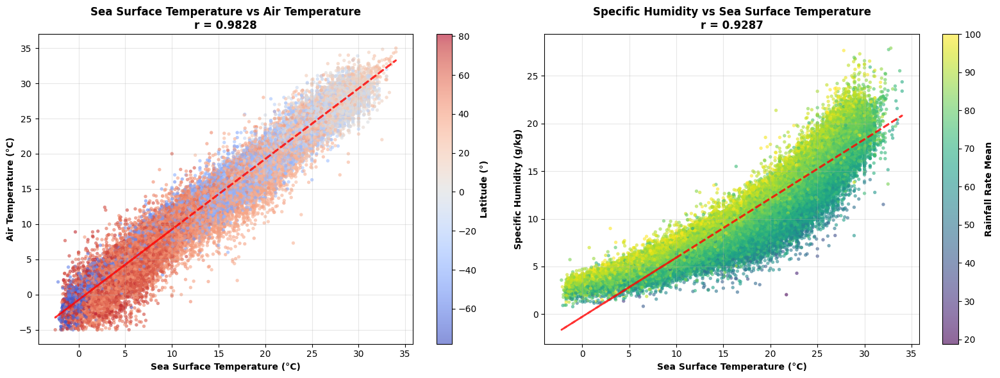

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Sea Surface Temperature vs Air Temperature (colored by latitude)
lat = df.loc[mask1, 'latitude'].values
scatter1 = ax1.scatter(sst_data, air_temp_data, c=lat, cmap='coolwarm', alpha=0.6, s=15, edgecolors='none')
ax1.set_xlabel('Sea Surface Temperature (°C)', fontweight='bold')
ax1.set_ylabel('Air Temperature (°C)', fontweight='bold')
ax1.set_title(f'Sea Surface Temperature vs Air Temperature\nr = {r_temp:.4f}', fontweight='bold')
ax1.grid(True, alpha=0.3)
z1 = np.polyfit(sst_data, air_temp_data, 1)
p1 = np.poly1d(z1)
ax1.plot(sst_data, p1(sst_data), "r--", alpha=0.8, linewidth=2)
cbar1 = plt.colorbar(scatter1, ax=ax1)
cbar1.set_label('Latitude (°)', fontweight='bold')

# Specific Humidity vs Sea Surface Temperature (colored by rainfall_rate_mean)
rrm = df.loc[mask2, 'rainfall_rate_mean'].values
scatter2 = ax2.scatter(temp_data, humidity_data, c=rrm, cmap='viridis', alpha=0.6, s=15, edgecolors='none')
ax2.set_xlabel('Sea Surface Temperature (°C)', fontweight='bold')
ax2.set_ylabel('Specific Humidity (g/kg)', fontweight='bold')
ax2.set_title(f'Specific Humidity vs Sea Surface Temperature\nr = {r_humid:.4f}', fontweight='bold')
ax2.grid(True, alpha=0.3)
z2 = np.polyfit(temp_data, humidity_data, 1)
p2 = np.poly1d(z2)
ax2.plot(temp_data, p2(temp_data), "r--", alpha=0.8, linewidth=2)
cbar2 = plt.colorbar(scatter2, ax=ax2)
cbar2.set_label('Rainfall Rate Mean', fontweight='bold')

plt.tight_layout()
plt.show()

The strong linear association between sea surface temperature (SST) and air temperature is expected as mentioned above.
The additional color gradient shows nonlinearities in the relationships despite the high correlation coefficients. This indicates that correlation alone cannot capture multivariate dependencies. To fully characterize these relationships, more advanced methods such as regression would be required.

In contrast, the relationship between specific humidity and SST shows a more upward curvature at higher temperatures. This nonlinearity likely reflects the [Clausius-Clapeyron relation](https://chem.libretexts.org/Bookshelves/Physical_and_Theoretical_Chemistry_Textbook_Maps/Supplemental_Modules_%28Physical_and_Theoretical_Chemistry%29/Physical_Properties_of_Matter/States_of_Matter/Phase_Transitions/Clausius-Clapeyron_Equation), which dictates that the air's moisture-holding capacity increases exponentially with temperature:

$$
e_s(T) = e_0 \cdot \exp\left(\frac{L_v}{R_v} \cdot \left(\frac{1}{T_0} - \frac{1}{T}\right)\right)
$$

where $e_s(T)$ is the saturation vapor pressure at temperature $T$, $e_0$ is a reference vapor pressure at temperature $T_0$, $L_v$ is the latent heat of vaporization, and $R_v$ is the gas constant for water vapor.

Though the Clausius-Clapeyron relation is physically based it is not very accurate across a broad temperature range when working with empirical data. Another aspect to consider is that the relation uses the absolute temperature scale in Kelvin. Therefore the [Tetens equation](https://journals.ametsoc.org/view/journals/apme/6/1/1520-0450_1967_006_0203_otcosv_2_0_co_2.xml) is used for plotting.

$$
e_s(T) = 6.112 \cdot \exp\left(\frac{17.67 \cdot T}{T + 243.5}\right)
$$

In the following plot the vapor pressure curve based on Tetens equation was added for reference. The scatter plot follows the trend in the vapor pressure curve.

<div align="center">
    <img src="plots/sh_sst_tetens.png" alt="Specific Humidity vs Sea Surface Temperature with Tetens Equation" style="max-width: 100%; width: 50%">
</div>





<h2 align="center">Group 5: Cloud and Wind Products</h2>

Group 5 variables represent atmospheric moisture and surface stress conditions that influence weather patterns and ocean-atmosphere interactions. The group contains the following variables: ``cloud_coverage``, ``rainfall_amount``, ``wind_stress_u``, ``wind_stress_v``.

Loading HuggingFace dataset...
Loading split '5'...


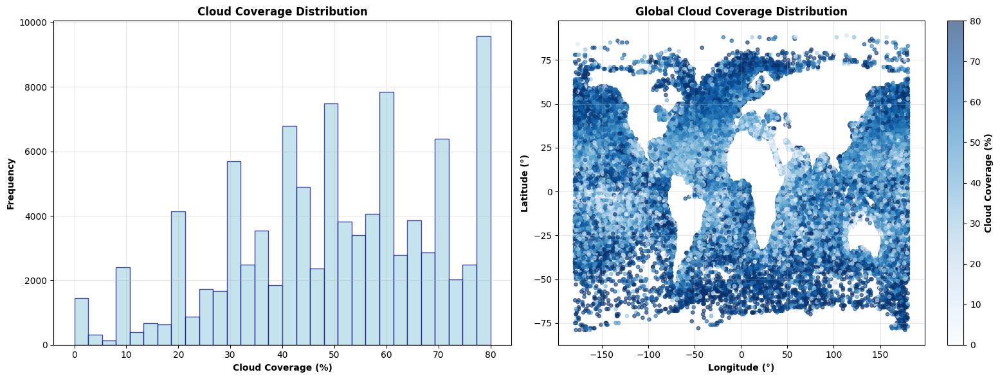

Cloud coverage range: 0.0% - 80.0%
Mean cloud coverage: 49.9%


In [16]:
g5_dataset = load_dataset(dataset_path=HF_DATASET_PATH, split="5")
g5_dataset = g5_dataset.map(normalize_batch, batched=True)
g5_sample = g5_dataset.shuffle(seed=42).select(range(SAMPLE_SIZE))

# 1. Cloud Coverage Distribution and Geographic Patterns
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

cloud_data_raw = [c for c in g5_sample['cloud_coverage_mean'] if c is not None and 0 <= c <= 10]
cloud_data = [c * 10 for c in cloud_data_raw]  # Convert from tenths to percentages

ax1.hist(cloud_data, bins=30, alpha=0.7, color='lightblue', edgecolor='navy')
ax1.set_xlabel('Cloud Coverage (%)', fontweight='bold')
ax1.set_ylabel('Frequency', fontweight='bold')
ax1.set_title('Cloud Coverage Distribution', fontweight='bold')
ax1.grid(True, alpha=0.3)

df_g5 = g5_sample.to_pandas()
mask_cloud = df_g5['cloud_coverage_mean'].notna()
lons = df_g5.loc[mask_cloud, 'longitude'].values
lats = df_g5.loc[mask_cloud, 'latitude'].values
clouds = df_g5.loc[mask_cloud, 'cloud_coverage_mean'].values * 10

scatter = ax2.scatter(lons, lats, c=clouds, cmap='Blues', s=15, alpha=0.6)
ax2.set_xlabel('Longitude (°)', fontweight='bold')
ax2.set_ylabel('Latitude (°)', fontweight='bold')
ax2.set_title('Global Cloud Coverage Distribution', fontweight='bold')
ax2.grid(True, alpha=0.3)
cbar = plt.colorbar(scatter, ax=ax2)
cbar.set_label('Cloud Coverage (%)', fontweight='bold')

plt.tight_layout()
plt.show()

print(f"Cloud coverage range: {min(cloud_data):.1f}% - {max(cloud_data):.1f}%")
print(f"Mean cloud coverage: {np.mean(cloud_data):.1f}%")

Äquatoriales Wolkenband?!

Remove cloud coverage distribution

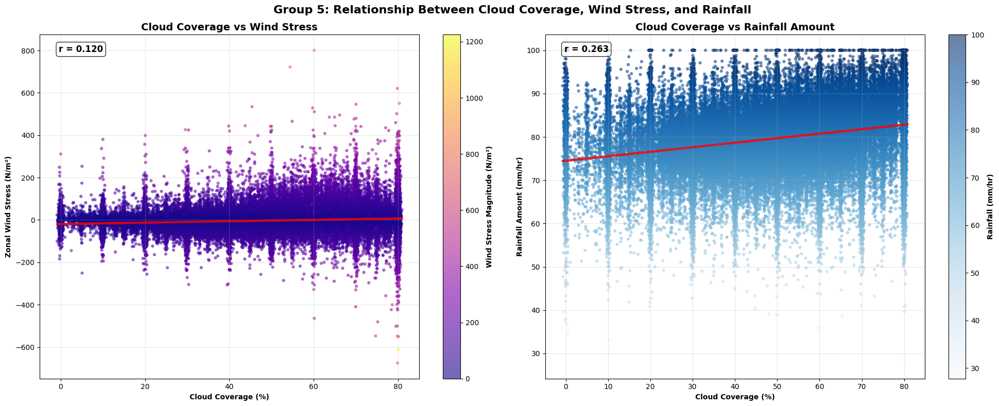

Cloud Coverage vs Wind Stress Correlation: r = 0.120
Cloud Coverage vs Rainfall Amount Correlation: r = 0.263


In [17]:
g5_sample = g5_dataset.shuffle(seed=42).select(range(SAMPLE_SIZE))
df_g5 = g5_sample.to_pandas()

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# 1. Cloud coverage vs wind stress
valid_mask_wind = df_g5['cloud_coverage_mean'].notna() & df_g5['wind_stress_u_mean'].notna()
if valid_mask_wind.sum() > 0:
    # converting cloud coverage from tenths to percentages
    cloud_data_wind = df_g5.loc[valid_mask_wind, 'cloud_coverage_mean'] * 10
    wind_u_data = df_g5.loc[valid_mask_wind, 'wind_stress_u_mean']
    wind_v_data = df_g5.loc[valid_mask_wind, 'wind_stress_v_mean']
    wind_mag_for_clouds = np.sqrt(wind_u_data**2 + wind_v_data**2)
    
    # small jitter for better visualization
    jitter_wind = np.random.normal(0, 0.25, size=cloud_data_wind.shape) 
    cloud_data_wind = cloud_data_wind + jitter_wind

    scatter1 = ax1.scatter(cloud_data_wind, wind_u_data, c=wind_mag_for_clouds, cmap='plasma', alpha=0.6, s=20, edgecolors='none')
    
    ax1.set_xlabel('Cloud Coverage (%)', fontweight='bold')
    ax1.set_ylabel('Zonal Wind Stress (N/m²)', fontweight='bold')
    ax1.set_title('Cloud Coverage vs Wind Stress', fontweight='bold', fontsize=14)
    ax1.grid(True, alpha=0.3)
    
    # trend line
    z1 = np.polyfit(cloud_data_wind, wind_u_data, 1)
    p1 = np.poly1d(z1)
    ax1.plot(cloud_data_wind, p1(cloud_data_wind), "r-", alpha=0.8, linewidth=3)
    
    # correlation
    from scipy.stats import pearsonr
    corr1, _ = pearsonr(cloud_data_wind, wind_u_data)
    ax1.text(0.05, 0.95, f'r = {corr1:.3f}', transform=ax1.transAxes, 
             fontweight='bold', fontsize=12, 
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    cbar1 = plt.colorbar(scatter1, ax=ax1)
    cbar1.set_label('Wind Stress Magnitude (N/m²)', fontweight='bold')

# 2. Cloud coverage vs rainfall
valid_mask_rain = df_g5['cloud_coverage_mean'].notna() & df_g5['rainfall_amount_mean'].notna()
if valid_mask_rain.sum() > 0:
    # converting cloud coverage from tenths to percentages
    cloud_data_rain = df_g5.loc[valid_mask_rain, 'cloud_coverage_mean'] * 10 
    rainfall_data = df_g5.loc[valid_mask_rain, 'rainfall_amount_mean']
    
    # small jitter for better visualization
    jitter_rain = np.random.normal(0, 0.25, size=cloud_data_rain.shape)
    cloud_data_rain = cloud_data_rain + jitter_rain

    scatter2 = ax2.scatter(cloud_data_rain, rainfall_data, c=rainfall_data, cmap='Blues', alpha=0.6, s=20, edgecolors='none')
    
    ax2.set_xlabel('Cloud Coverage (%)', fontweight='bold')
    ax2.set_ylabel('Rainfall Amount (mm/hr)', fontweight='bold')
    ax2.set_title('Cloud Coverage vs Rainfall Amount', fontweight='bold', fontsize=14)
    ax2.grid(True, alpha=0.3)
    
    # trend line
    z2 = np.polyfit(cloud_data_rain, rainfall_data, 1)
    p2 = np.poly1d(z2)
    ax2.plot(cloud_data_rain, p2(cloud_data_rain), "r-", alpha=0.8, linewidth=3)
    
    # correlation
    corr2, _ = pearsonr(cloud_data_rain, rainfall_data)
    ax2.text(0.05, 0.95, f'r = {corr2:.3f}', transform=ax2.transAxes, 
             fontweight='bold', fontsize=12, 
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    cbar2 = plt.colorbar(scatter2, ax=ax2)
    cbar2.set_label('Rainfall (mm/hr)', fontweight='bold')

plt.suptitle('Group 5: Relationship Between Cloud Coverage, Wind Stress, and Rainfall', fontweight='bold', fontsize=16, y=0.98)

plt.tight_layout()
plt.show()

print(f"Cloud Coverage vs Wind Stress Correlation: r = {corr1:.3f}")
print(f"Cloud Coverage vs Rainfall Amount Correlation: r = {corr2:.3f}")

<h3 align="center">Discrete Cloud Coverage Values</h3>

The scatter plots reveal a distinct **banding pattern** where cloud coverage values cluster at discrete integer percentages (0%, 5%, 10%, etc.) rather than forming a continuous distribution. This phenomenon reflects the **observational and data processing methods** used in meteorological data collection rather than true atmospheric discreteness.

<h3 align="center">Wind Stress</h3>


When wind blows over the ocean surface, it creates a tangential (parallel) force due to the friction between the moving air and the relatively stationary water. This force is called wind stress, and it's the primary mechanism by which the atmosphere transfers momentum to the ocean. Wind stress represents *"the component of the wind force that acts parallel to the surface per unit area"* and is measured in units of force per area (N/m²).

In the IOCASS dataset, wind stress is represented by two components:
- **Zonal Wind Stress (U-component)**: The east-west component, where positive values indicate eastward stress
- **Meridional Wind Stress (V-component)**: The north-south component, where positive values indicate northward stress

<h2 align="center">Group 6 & 7: (Wind-) Temperature and Humidity</h2>

Group 6 and 7 variables represent atmospheric temperature and humidity interactions that are crucial for understanding weather patterns and climate dynamics. The group contains the following variables: ``sea_air_temp_diff``, ``temp_diff_wind``, ``humidity_deficit``, ``humidity_flux``, ``wind_u_temp``, ``wind_v_temp``, ``wind_u_humidity``, ``wind_v_humidity``. 

**Flux** refers to the **rate of flow of a physical quantity per unit area per unit time**. In the case of the IOCADS dataset, flux represents the movement of properties like moisture, heat, or momentum across interfaces.

Key types of flux in Groups 6 & 7:

**Humidity Flux**: The rate of moisture transfer between the ocean surface and atmosphere
**Heat Flux**: Energy transfer due to temperature differences
- **Momentum Flux**: Transfer of motion (related to wind stress)

The flux rate is measured in $\frac{kg}{m^2\,s}$ for moisture flux, or $\frac{\mathrm{W}}{\mathrm{m^2}}$ for heat flux, representing how much of a quantity passes through a unit area per unit time.


In [18]:
g_6_dataset = load_dataset(dataset_path=HF_DATASET_PATH, split="6")
g_6_dataset = g_6_dataset.map(normalize_batch, batched=True)
g_6_sample = g_6_dataset.shuffle(seed=42).select(range(SAMPLE_SIZE))

g_7_dataset = load_dataset(dataset_path=HF_DATASET_PATH, split="7")
g_7_dataset = g_7_dataset.map(normalize_batch, batched=True)
g_7_sample = g_7_dataset.shuffle(seed=42).select(range(SAMPLE_SIZE))


Loading HuggingFace dataset...
Loading split '6'...
Loading HuggingFace dataset...
Loading split '7'...


In [20]:
# Group 6 & 7: Advanced Analysis and Visualization

# First, let's explore what variables we have
print("=== GROUP 6 VARIABLES ===")
print("Temperature/Humidity Differences:")
print(f"Columns: {g_6_dataset.column_names}")
print(f"Entries: {len(g_6_dataset)}")

print("\n=== GROUP 7 VARIABLES ===")
print("Wind-Temperature/Humidity Products:")
print(f"Columns: {g_7_dataset.column_names}")
print(f"Entries: {len(g_7_dataset)}")

# Convert to pandas for easier analysis
df_g6 = g_6_sample.to_pandas()
df_g7 = g_7_sample.to_pandas()

=== GROUP 6 VARIABLES ===
Temperature/Humidity Differences:
Columns: ['year', 'month', 'longitude', 'latitude', 'box_size_degrees', 'platform_id1', 'platform_id2', 'data_group', 'checksum', 'source_file', 'sea_air_temp_diff_tercile1', 'sea_air_temp_diff_median', 'sea_air_temp_diff_tercile3', 'sea_air_temp_diff_mean', 'temp_diff_wind_tercile1', 'temp_diff_wind_median', 'temp_diff_wind_tercile3', 'temp_diff_wind_mean', 'humidity_deficit_tercile1', 'humidity_deficit_median', 'humidity_deficit_tercile3', 'humidity_deficit_mean', 'humidity_flux_tercile1', 'humidity_flux_median', 'humidity_flux_tercile3', 'humidity_flux_mean', 'date_string']
Entries: 2072280

=== GROUP 7 VARIABLES ===
Wind-Temperature/Humidity Products:
Columns: ['year', 'month', 'longitude', 'latitude', 'box_size_degrees', 'platform_id1', 'platform_id2', 'data_group', 'checksum', 'source_file', 'wind_u_temp_tercile1', 'wind_u_temp_median', 'wind_u_temp_tercile3', 'wind_u_temp_mean', 'wind_v_temp_tercile1', 'wind_v_temp_medi

<h3 align="center">Gulf Stream Visualization</h3>

The Gulf Stream was chosen as a visualization method for the ``sea_air_temp_diff_mean`` variable due to its significance for the european climate. The code below uses interpolation to create a smoother representation of the Gulf Stream's path. 

Points with neighbors: 15800 out of 15813
Interpolation using 15800 connected points
Interpolation distance limited to 0.8 degree from connected points


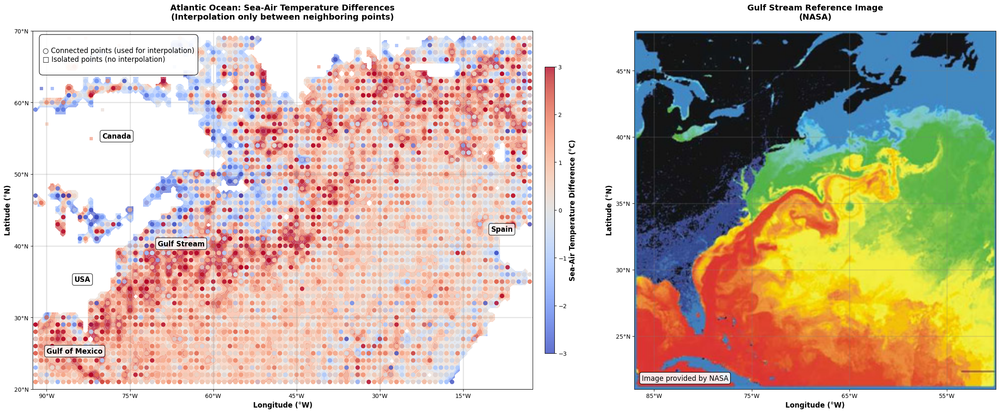

In [21]:
mask_temp_diff = df_g6['sea_air_temp_diff_mean'].notna()
lons_td = df_g6.loc[mask_temp_diff, 'longitude'].values
lats_td = df_g6.loc[mask_temp_diff, 'latitude'].values
temp_diffs = df_g6.loc[mask_temp_diff, 'sea_air_temp_diff_mean'].values

atlantic_mask = (
    (lons_td >= -92.5) & (lons_td <= -2.5) &    # longitude
    (lats_td >= 21) & (lats_td <= 69) &         # latitude
    (temp_diffs >= -4) & (temp_diffs <= 5)      # temp diff. range
)

atlantic_lons = lons_td[atlantic_mask]
atlantic_lats = lats_td[atlantic_mask]
atlantic_temps = temp_diffs[atlantic_mask]

# Make ax1 plot double the width of ax2 plot
fig = plt.figure(figsize=(24, 10))
gs = fig.add_gridspec(1, 2, width_ratios=[5, 3])
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])

data_points = np.column_stack([atlantic_lons, atlantic_lats])

neighbor_threshold = 1.5 
min_neighbors = 2  # minimum number of neighbors (including itself)
nbrs = NearestNeighbors(n_neighbors=min_neighbors+1, radius=neighbor_threshold).fit(data_points)
distances, indices = nbrs.radius_neighbors(data_points, radius=neighbor_threshold)

connected_points_mask = np.array([len(dist) >= min_neighbors for dist in distances])

print(f"Points with neighbors: {np.sum(connected_points_mask)} out of {len(atlantic_temps)}")

# using only connected points for interpolation
if np.sum(connected_points_mask) > 0:
    connected_lons = atlantic_lons[connected_points_mask]
    connected_lats = atlantic_lats[connected_points_mask]
    connected_temps = atlantic_temps[connected_points_mask]
    
    lon_grid = np.linspace(-92.5, -2.5, 200)
    lat_grid = np.linspace(21, 69, 150)
    lon_mesh, lat_mesh = np.meshgrid(lon_grid, lat_grid)
    
    # interpolating using the connected points
    temp_interpolated = griddata((connected_lons, connected_lats), connected_temps, (lon_mesh, lat_mesh), method='linear', fill_value=np.nan)
    
    grid_points = np.column_stack([lon_mesh.ravel(), lat_mesh.ravel()])
    connected_data_points = np.column_stack([connected_lons, connected_lats])
    
    # calc min. distance from each grid point to nearest connected data point
    distances_to_connected = cdist(grid_points, connected_data_points)
    min_distances_to_connected = np.min(distances_to_connected, axis=1)
    
    #  distance for interpolation: set to touching points
    max_interpolation_distance = 0.8
    interpolation_mask = min_distances_to_connected <= max_interpolation_distance
    
    interpolation_mask = interpolation_mask.reshape(lon_mesh.shape)
    
    # applying
    temp_interpolated_masked = np.where(interpolation_mask, temp_interpolated, np.nan)
    
    contour = ax1.contourf(lon_mesh, lat_mesh, temp_interpolated_masked, levels=20, cmap='coolwarm', vmin=-3, vmax=3, alpha=0.6)
    
    print(f"Interpolation using {len(connected_temps)} connected points")
    print(f"Interpolation distance limited to {max_interpolation_distance} degree from connected points")

else:
    print("No connected points found.\nNot interpolation is used.")

# differnet markers for connected vs isolated points
isolated_mask = ~connected_points_mask

# connected point
if np.sum(connected_points_mask) > 0:
    scatter_connected = ax1.scatter(atlantic_lons[connected_points_mask], atlantic_lats[connected_points_mask], 
                                  c=atlantic_temps[connected_points_mask], 
                                  cmap='coolwarm', s=50, alpha=0.8, 
                                  vmin=-3, vmax=3, linewidth=0.5, marker='o',
                                  label=f'Connected points ({np.sum(connected_points_mask)})')

# isolated points
if np.sum(isolated_mask) > 0:
    scatter_isolated = ax1.scatter(atlantic_lons[isolated_mask], atlantic_lats[isolated_mask], 
                                 c=atlantic_temps[isolated_mask], 
                                 cmap='coolwarm', s=25, alpha=0.6, 
                                 vmin=-3, vmax=3, linewidth=0.5, marker='s',
                                 label=f'Isolated points ({np.sum(isolated_mask)})')

# using scatter for colorbar
scatter_for_colorbar = scatter_connected if np.sum(connected_points_mask) > 0 else ax1.scatter(atlantic_lons, atlantic_lats, c=atlantic_temps, cmap='coolwarm', s=45, alpha=0.8, vmin=-3, vmax=3)

ax1.set_xlabel('Longitude (°W)', fontweight='bold', fontsize=12)
ax1.set_ylabel('Latitude (°N)', fontweight='bold', fontsize=12)
ax1.set_title('Atlantic Ocean: Sea-Air Temperature Differences\n(Interpolation only between neighboring points)', fontweight='bold', fontsize=14, pad=20)

ax1.set_xlim(-92.5, -2.5)
ax1.set_ylim(21, 69)

# colorbar
cbar = plt.colorbar(scatter_for_colorbar, ax=ax1, orientation='vertical', shrink=0.8, pad=0.02, aspect=30)
cbar.set_label('Sea-Air Temperature Difference (°C)', fontweight='bold', fontsize=12)
cbar.ax.tick_params(labelsize=10)

x_ticks = np.arange(-90, 0, 15)
x_labels = [f'{abs(x)}°W' for x in x_ticks]
ax1.set_xticks(x_ticks)
ax1.set_xticklabels(x_labels)

y_ticks = np.arange(20, 75, 10)
y_labels = [f'{y}°N' for y in y_ticks]
ax1.set_yticks(y_ticks)
ax1.set_yticklabels(y_labels)

ax1.grid(True, alpha=0.2, linestyle='-', linewidth=2, color='gray')

ax1.text(-70, 40, 'Gulf Stream', fontsize=12, fontweight='bold', bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.8))
ax1.text(-90, 25, 'Gulf of Mexico', fontsize=12, fontweight='bold', bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.8))
ax1.text(-85, 35, 'USA', fontsize=12, fontweight='bold', bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.8))
ax1.text(-80, 55, 'Canada', fontsize=12, fontweight='bold', bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.8))
ax1.text(-10, 42, 'Spain', fontsize=12, fontweight='bold', bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.8))

legend_text = """
○ Connected points (used for interpolation)
□ Isolated points (no interpolation)
"""
ax1.text(0.02, 0.98, legend_text, transform=ax1.transAxes, fontsize=12, verticalalignment='top', bbox=dict(boxstyle="round,pad=0.5", facecolor='white', alpha=0.9))

gulf_stream_img = plt.imread(r"C:\Users\leobe\OneDrive\Documents\KIK 4-Thinkpad-Behr\KI-Life-Sciences\plots\Golfstrom.jpg")

ax2.imshow(gulf_stream_img, extent=[-87, -50, 21, 48], aspect='auto', interpolation='bilinear')
ax2.set_xlabel('Longitude (°W)', fontweight='bold', fontsize=12)
ax2.set_ylabel('Latitude (°N)', fontweight='bold', fontsize=12)
ax2.set_title('Gulf Stream Reference Image\n(NASA)', fontweight='bold', fontsize=14, pad=20)

ax2.set_xlim(-87, -50)
ax2.set_ylim(21, 48)

x_ticks_ax2 = np.arange(-85, -45, 10) 
x_labels_ax2 = [f'{abs(x)}°W' for x in x_ticks_ax2]
ax2.set_xticks(x_ticks_ax2)
ax2.set_xticklabels(x_labels_ax2)

y_ticks_ax2 = np.arange(25, 50, 5)
y_labels_ax2 = [f'{y}°N' for y in y_ticks_ax2]
ax2.set_yticks(y_ticks_ax2)
ax2.set_yticklabels(y_labels_ax2)

ax2.grid(True, alpha=0.2, linestyle='-', linewidth=2, color='grey')

reference_text = """Image provided by NASA"""
ax2.text(0.02, 0.02, reference_text, transform=ax2.transAxes, fontsize=12, verticalalignment='bottom', bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.9))

plt.tight_layout()
plt.show()


<h3 align="center">Why was <b><i>sea_air_temp_diff_mean</i></b> used instead of <b><i>sea_surface_temp_mean</i></b>?</h3>

While sea surface temperature alone provides valuable oceanographic data, the Gulf Stream's distinctive pattern becomes remarkably more visible when examining sea-air temperature difference rather than absolute temperature values. This differential approach effectively acts as a natural filter that highlights ocean current dynamics. The differences between the two variables in detail:

- **Background pattern removal**: By analysing the temperature difference rather than absolute values, large-scale latitudinal temperature gradients are almost entirely removed. 

- **Enhanced thermal contrast**: The contrast enables a better visualization of the Gulf Stream as it highlights the temperature differences better than absolute values. 

- **Air-Sea heat exchange**: The Gulf Stream actively exchanges heat with the atmosphere, creating a distinctive thermal fingerprint that is more apparent in the differential measurement.

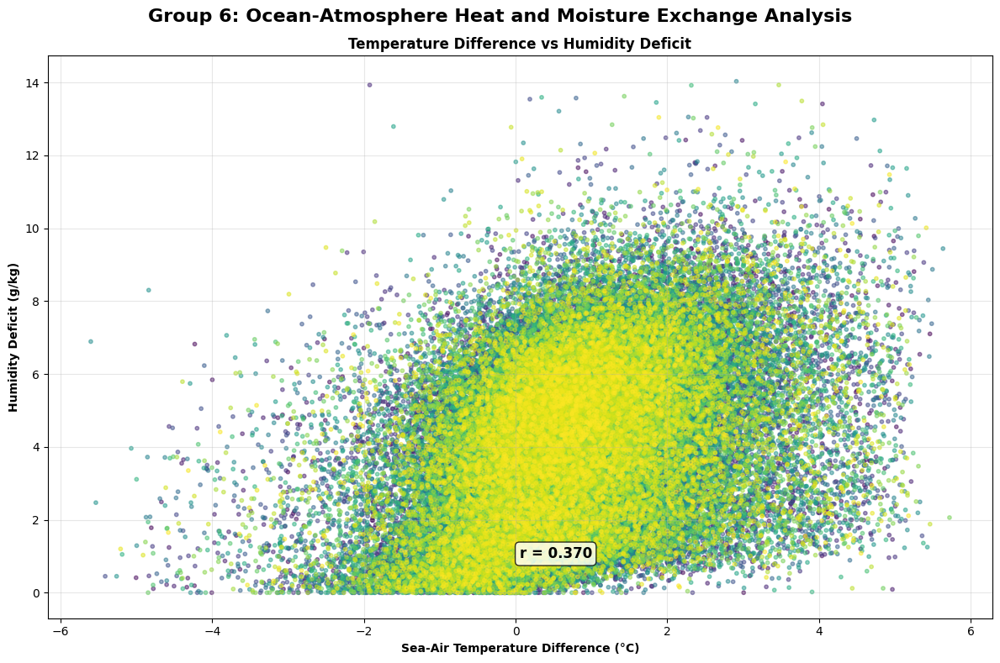

In [22]:
fig = plt.figure(figsize=(12, 8))

# Correlation between temperature difference and humidity deficit
mask_both = df_g6['sea_air_temp_diff_mean'].notna() & df_g6['humidity_deficit_mean'].notna()
temp_diff_corr = df_g6.loc[mask_both, 'sea_air_temp_diff_mean'].values
humidity_def_corr = df_g6.loc[mask_both, 'humidity_deficit_mean'].values

# Filter for reasonable ranges
valid_corr_mask = (temp_diff_corr >= -5) & (temp_diff_corr <= 5) & (humidity_def_corr >= 0) & (humidity_def_corr <= 15)
temp_diff_corr = temp_diff_corr[valid_corr_mask]
humidity_def_corr = humidity_def_corr[valid_corr_mask]

jitter = np.random.normal(0, 0.25, size=temp_diff_corr.shape)
temp_diff_corr += jitter

scatter2 = plt.scatter(temp_diff_corr, humidity_def_corr, alpha=0.5, s=10, c=np.arange(len(temp_diff_corr)), cmap='viridis')
plt.xlabel('Sea-Air Temperature Difference (°C)', fontweight='bold')
plt.ylabel('Humidity Deficit (g/kg)', fontweight='bold')
plt.title('Temperature Difference vs Humidity Deficit', fontweight='bold')
plt.grid(True, alpha=0.3)

# Add correlation coefficient
if len(temp_diff_corr) > 0:
    corr_td_hd, _ = pearsonr(temp_diff_corr, humidity_def_corr)
    plt.text(0.05, 0.95, f'r = {corr_td_hd:.3f}', 
             fontweight='bold', fontsize=12, 
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.suptitle('Group 6: Ocean-Atmosphere Heat and Moisture Exchange Analysis', 
             fontweight='bold', fontsize=16, y=0.98)
plt.tight_layout()
plt.show()

<h2 align="center">Group 9: Moisture Flux and Turbulence</h2>

TODO...

In [ ]:
g9_dataset = load_dataset(dataset_path=HF_DATASET_PATH, split="9")
g9_dataset = g9_dataset.map(normalize_batch, batched=True)
g9_sample = g9_dataset.shuffle(seed=42).select(range(SAMPLE_SIZE))

# Convert to pandas for analysis
df_g9 = g9_sample.to_pandas()

# Filter for North Atlantic region (similar to your pressure analysis)
north_atlantic_mask = (
    (df_g9['longitude'] >= -70) & (df_g9['longitude'] <= 20) &
    (df_g9['latitude'] >= 20) & (df_g9['latitude'] <= 75) &
    (df_g9['moisture_flux_u_mean'].notna()) & 
    (df_g9['moisture_flux_v_mean'].notna()) &
    (abs(df_g9['moisture_flux_u_mean']) <= 50) &  # Remove extreme outliers
    (abs(df_g9['moisture_flux_v_mean']) <= 50)
)

# Extract valid data
lons = df_g9.loc[north_atlantic_mask, 'longitude'].values
lats = df_g9.loc[north_atlantic_mask, 'latitude'].values
flux_u = df_g9.loc[north_atlantic_mask, 'moisture_flux_u_mean'].values
flux_v = df_g9.loc[north_atlantic_mask, 'moisture_flux_v_mean'].values

# Calculate moisture flux magnitude
flux_magnitude = np.sqrt(flux_u**2 + flux_v**2)

# Create grid for interpolation
lon_grid = np.linspace(-70, 20, 50)  # Reduced resolution for vectors
lat_grid = np.linspace(20, 75, 30)
lon_mesh, lat_mesh = np.meshgrid(lon_grid, lat_grid)

# Interpolate flux components
flux_u_grid = griddata((lons, lats), flux_u, (lon_mesh, lat_mesh), method='linear')
flux_v_grid = griddata((lons, lats), flux_v, (lon_mesh, lat_mesh), method='linear')

# Create the plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# Left plot: Vector field
flux_mag_grid = np.sqrt(flux_u_grid**2 + flux_v_grid**2)
im1 = ax1.contourf(lon_mesh, lat_mesh, flux_mag_grid, levels=20, cmap='viridis', alpha=0.7)

# Add vector arrows (subsample for clarity)
skip = 3
ax1.quiver(lon_mesh[::skip, ::skip], lat_mesh[::skip, ::skip], 
           flux_u_grid[::skip, ::skip], flux_v_grid[::skip, ::skip],
           scale=200, scale_units='xy', angles='xy', color='white', alpha=0.8)

ax1.set_xlabel('Longitude (°)', fontweight='bold')
ax1.set_ylabel('Latitude (°)', fontweight='bold')
ax1.set_title('Moisture Flux Vector Field\nNorth Atlantic Region', fontweight='bold', fontsize=14)
ax1.grid(True, alpha=0.3)

cbar1 = plt.colorbar(im1, ax=ax1)
cbar1.set_label('Moisture Flux Magnitude (g·kg⁻¹·m·s⁻¹)', fontweight='bold')

# Add regional labels
ax1.text(-30, 65, 'Iceland', fontsize=11, fontweight='bold', ha='center', 
         bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.8))
ax1.text(10, 48, 'Europe', fontsize=11, fontweight='bold', ha='center',
         bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.8))

# Right plot: Scatter plot of flux components
valid_mask = ~np.isnan(flux_u) & ~np.isnan(flux_v)
flux_u_valid = flux_u[valid_mask]
flux_v_valid = flux_v[valid_mask]
flux_mag_valid = flux_magnitude[valid_mask]

scatter = ax2.scatter(flux_u_valid, flux_v_valid, c=flux_mag_valid, 
                     cmap='viridis', s=15, alpha=0.6, edgecolors='none')

ax2.set_xlabel('Zonal Moisture Flux (g·kg⁻¹·m·s⁻¹)', fontweight='bold')
ax2.set_ylabel('Meridional Moisture Flux (g·kg⁻¹·m·s⁻¹)', fontweight='bold')
ax2.set_title('Moisture Flux Components\nU vs V Components', fontweight='bold', fontsize=14)
ax2.grid(True, alpha=0.3)
ax2.axhline(y=0, color='red', linestyle='--', alpha=0.5)
ax2.axvline(x=0, color='red', linestyle='--', alpha=0.5)

cbar2 = plt.colorbar(scatter, ax=ax2)
cbar2.set_label('Flux Magnitude (g·kg⁻¹·m·s⁻¹)', fontweight='bold')

plt.tight_layout()
plt.show()

print(f"Moisture Flux Analysis Summary:")
print(f"Mean zonal flux: {np.nanmean(flux_u):.3f} g·kg⁻¹·m·s⁻¹")
print(f"Mean meridional flux: {np.nanmean(flux_v):.3f} g·kg⁻¹·m·s⁻¹")
print(f"Mean flux magnitude: {np.nanmean(flux_magnitude):.3f} g·kg⁻¹·m·s⁻¹")

<h2 align="center">Visualizing Climate Change</h2>

In this section, we use visualizations to explore trends and patterns in the IOCADS dataset related to climate change. The focus is on identifying long-term changes and variability in key climate variables such as temperature or atmospheric moisture. 

In [23]:
large_dataset_path = r"C:\Users\leobe\OneDrive\Documents\KIK 4-Thinkpad-Behr\KI-Life-Sciences\notebook\hf_dataset_3\icoads_ENH_G3_hf_dataset"
g_3_large_dataset = load_dataset(dataset_path=large_dataset_path, split="3")
g_3_large_dataset = g_3_large_dataset.map(normalize_batch, batched=True)


Loading HuggingFace dataset...
Loading split '3'...


Map:   0%|          | 0/12873313 [00:00<?, ? examples/s]

<h3 align="center"><b>Why the Mediterranean?</b></h4>

For some plots the Mediterranean Sea was chosen as a representative region to visualize the trends. The Mediterranean Sea is one of earths regions with the highest warming rates, which makes it a good candidate for visualizing climate change trends (source: [UFM](https://ufmsecretariat.org/what-we-do/energy-and-climate-action/medecc-scientific-reports-on-climate-and-environmental-change-in-the-mediterranean/)).

Used datapoints for the Mediterranean Sea:


In [24]:
df_climate = g_3_large_dataset.to_pandas()
df_med = df_climate[
    (df_climate['longitude'] >= 5) & (df_climate['longitude'] <= 40) &
    (df_climate['latitude'] >= 30) & (df_climate['latitude'] <= 45)
]

sst_mask = (
    df_med['sea_surface_temp_mean'].notna() & 
    (df_med['sea_surface_temp_mean'] >= -5) & 
    (df_med['sea_surface_temp_mean'] <= 35)
)
df_med_sst = df_med[sst_mask]

sample_size = min(2000, len(df_med_sst))
df_sample = df_med_sst.sample(n=sample_size, random_state=42)

med_map = folium.Map(
    location=[37.5, 22.5],  # center
    zoom_start=5
)

rectangle_coords = [
    [30, 5],   # SW
    [30, 40],  # SE  
    [45, 40],  # NE
    [45, 5],   # NW
    [30, 5]
]

folium.Polygon(
    locations=rectangle_coords,
    color='red',
    weight=3,
    fill=False,
    popup='Mediterranean Area: 30°-45°N, 5°-40°E'
).add_to(med_map)

# data points
for _, row in df_sample.iterrows():
    lat = row['latitude']
    lon = row['longitude']
    sst = row['sea_surface_temp_mean']
    
    color = 'blue'
    
    folium.CircleMarker(
        location=[lat, lon],
        radius=3,
        popup=f'SST: {sst:.1f}°C<br>Lat: {lat:.2f}° Lon: {lon:.2f}°',
        color=color,
        fill=True,
        fillOpacity=0.7
    ).add_to(med_map)

med_map

<h3 align="center">Mean Monthly Sea Surface Temperature</h3>

In [25]:
df_climate = g_3_large_dataset.to_pandas()

# only mediterranean sea data
df_climate = df_climate[(df_climate['longitude'] >= 5) & (df_climate['longitude'] <= 40) &
                        (df_climate['latitude'] >= 30) & (df_climate['latitude'] <= 45)]


temp_mask = (df_climate['sea_surface_temp_mean'].notna()) & \
            (df_climate['sea_surface_temp_mean'] >= -5) & \
            (df_climate['sea_surface_temp_mean'] <= 35)

df_temp = df_climate[temp_mask].copy()

monthly_temps = df_temp.groupby(['year', 'month'])['sea_surface_temp_mean'].mean().reset_index()

print(f"Data spans: {monthly_temps['year'].min()} - {monthly_temps['year'].max()}")
print(f"Total data points: {len(monthly_temps)}")

fig = go.Figure()

years = sorted(monthly_temps['year'].unique())
n_years = len(years)

colors = px.colors.sequential.Turbo

for i, year in enumerate(years):
    year_data = monthly_temps[monthly_temps['year'] == year]
    
    if len(year_data) == 12:  # only included when all months have data
        # color based on year (early years = blue, recent = red)
        color_idx = int((i / (n_years - 1)) * (len(colors) - 1))
        color = colors[color_idx]
        
        # for better visibility, i use different line widths and opacities based on the year
        if year >= 2010:
            line_width = 3
            opacity = 0.9
        elif year >= 2000:
            line_width = 2.5
            opacity = 0.8
        elif year >= 1990:
            line_width = 2
            opacity = 0.7
        else:
            line_width = 1.5
            opacity = 0.6
            
        fig.add_trace(go.Scatter(
            x=year_data['month'],
            y=year_data['sea_surface_temp_mean'],
            mode='lines+markers',
            name=str(year),
            line=dict(color=color, width=line_width),
            opacity=opacity,
            hovertemplate=f'<b>Year: {year}</b><br>' + 'Month: %{x}<br>' + 'Temperature: %{y:.2f}°C<br>' + '<extra></extra>',
            showlegend=False
        ))


fig.update_layout(
    title={
        'text': 'Mean Sea Surface Temperature by Month and Year in the Mediterranean<br>' + f'<sub>Data from {years[0]} - {years[-1]} | ICOADS Dataset</sub>',
        'x': 0.5,
        'font': {'size': 16}
    },
    xaxis_title='Month',
    yaxis_title='Sea Surface Temperature (°C)',
    xaxis=dict(
        tickmode='array',
        tickvals=list(range(1, 13)),
        ticktext=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
    ),
    hovermode='closest',
    plot_bgcolor='white',
    width=1200,
    height=700
)

fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgray')
fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgray')
fig.show()


Data spans: 1960 - 2014
Total data points: 660


<h4 align="center"><b>Mean Monthly Sea Surface Temperature</b></h4>

The multi-line plot shows the mean SST in the Mediterranean across all months from 1960 to 2014. Each line represents the temperature cycle of a single year, with colors transitioning from cooler (blue / green) in earlier decades to warmer (orange / red) in recent years.

The plot displays a clear seasonal cycle, with temperatures peaking in late summer (August) and dipping in winter (February / March). Beyond this seasonal cycle, the progressive rise in SST over the decades is evident, with the 2010s showing significantly higher temperatures compared to the 1960s.  

<h3 align="center">Average Yearly Sea Surface and Air Temperature</h3>

In [26]:
df_climate = g_3_large_dataset.to_pandas()

df_climate = df_climate[(df_climate['longitude'] >= 5) & (df_climate['longitude'] <= 40) &
                        (df_climate['latitude'] >= 30) & (df_climate['latitude'] <= 45)]

mask_year_temp = (
    df_climate['sea_surface_temp_mean'].notna() &
    (df_climate['sea_surface_temp_mean'] >= -5) &
    (df_climate['sea_surface_temp_mean'] <= 35) &
    (df_climate['air_temp_mean'].notna()) &
    (df_climate['air_temp_mean'] >= -5) &
    (df_climate['air_temp_mean'] <= 35) &
    df_climate['year'].notna()
)
df_g3_valid = df_climate[mask_year_temp]

yearly_avg_sea_temp = df_g3_valid.groupby('year')['sea_surface_temp_mean'].mean()

yearly_avg_temp = df_g3_valid.groupby('year')['air_temp_mean'].mean()

fig = go.Figure()

fig.add_trace(go.Scatter(
    x=yearly_avg_sea_temp.index,
    y=yearly_avg_sea_temp.values,
    mode='lines+markers',
    marker=dict(symbol='circle', color='steelblue'),
    line=dict(color='steelblue', width=3),
    hovertemplate='Year: %{x}<br>Sea Surface Temp: %{y:.2f}°C'
))

fig.add_trace(go.Scatter(
    x=yearly_avg_temp.index,
    y=yearly_avg_temp.values,
    mode='lines+markers',
    marker=dict(symbol='x', color='orange'),
    line=dict(color='orange', width=3),
    hovertemplate='Year: %{x}<br>Air Temp: %{y:.2f}°C'
))

# calc trend lines
slope_sea, intercept_sea, r_value_sea, p_value_sea, std_err_sea = linregress(yearly_avg_sea_temp.index, yearly_avg_sea_temp.values)
slope_air, intercept_air, r_value_air, p_value_air, std_err_air = linregress(yearly_avg_temp.index, yearly_avg_temp.values)

trend_line_sea = slope_sea * yearly_avg_sea_temp.index + intercept_sea
trend_line_air = slope_air * yearly_avg_temp.index + intercept_air

# trend lines
fig.add_trace(go.Scatter(
    x=yearly_avg_sea_temp.index,
    y=trend_line_sea,
    mode='lines',
    line=dict(color='steelblue', width=3, dash='dash'),
    name=f'Sea Surface Trend ({slope_sea:.4f}°C/year)',
    hovertemplate='Year: %{x}<br>Trend: %{y:.2f}°C'
))

fig.add_trace(go.Scatter(
    x=yearly_avg_temp.index,
    y=trend_line_air,
    mode='lines',
    line=dict(color='orange', width=3, dash='dash'),
    name=f'Air Temp Trend ({slope_air:.4f}°C/year)',
    hovertemplate='Year: %{x}<br>Trend: %{y:.2f}°C'
))

fig.update_layout(
    title='Average Yearly Sea Surface and Air Temperature in the Mediterranean',
    xaxis_title='Year',
    yaxis_title='Average Temperature (°C)',
    legend=dict(
        x=0.01, y=0.99, bgcolor='rgba(255,255,255,0.7)',
        title='',
        itemsizing='constant'
    ),
    template='plotly_white',
    width=900,
    height=500
)

fig.data[0].name = 'Sea Surface Temp'
fig.data[1].name = 'Air Temp'

fig.show()

<h4 align="center"><b>Average Yearly Sea Surface and Air Temperature</b></h4>

The four lines represent the average yearly SST and air temperature for the Mediterranean as well as their trend lines. Both variables show a clear upward trajectory.

The trend lines indicate an average increase of approximately +0.024°C/year for SST and +0.026°C/year for air temperature. While both are rising, air temperatures show a marginally faster rate of increase.

These trends highlight the coupled nature of ocean-atmosphere interactions where both marine and atmospheric systems are warming simultaneously. 

<h3 align="center">Monthly Sea Surface Temperature Anomalies in the Mediterranean</h3>

In [ ]:
df_climate_med = g_3_large_dataset.to_pandas()

# again, only mediterranean sea data
df_climate_med = df_climate_med[(df_climate_med['longitude'] >= 5) & (df_climate_med['longitude'] <= 40) &
                                (df_climate_med['latitude'] >= 30) & (df_climate_med['latitude'] <= 45)]

temp_mask = (df_climate_med['sea_surface_temp_mean'].notna()) & \
           (df_climate_med['sea_surface_temp_mean'] >= -5) & \
           (df_climate_med['sea_surface_temp_mean'] <= 35)

df_temp = df_climate_med[temp_mask].copy()
monthly_temps = df_temp.groupby(['year', 'month'])['sea_surface_temp_mean'].mean().reset_index()

pivot_data = monthly_temps.pivot(index='year', columns='month', values='sea_surface_temp_mean')

# calc anomalies based on the baseline from 1961 to 1990
baseline_med = pivot_data[(pivot_data.index >= 1961) & (pivot_data.index <= 1990)].mean()
pivot_anomalies = pivot_data.subtract(baseline_med, axis=1)

fig_heat = px.imshow(
    pivot_anomalies, 
    labels=dict(x="Month", y="Year", color="Temperature Anomaly (°C)"),
    x=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'],
    y=pivot_anomalies.index,
    color_continuous_scale='RdBu_r',
    color_continuous_midpoint=0,
    aspect="auto"
)

fig_heat.update_layout(
    title='Monthly Sea Surface Temperature Anomalies in the Mediterranean (1961-2014)<br>' +
          '<sub>Red = Warmer than 1961-1990 baseline, Blue = Cooler</sub>',
    width=1000,
    height=800
)

fig_heat.show()

<h4 align="center"><b>Monthly Sea Surface Temperature Anomalies in the Mediterranean</b></h4>

This heatmap visualizes monthly sea surface temperature (SST) anomalies in the Mediterranean relative to the 1961–1990 meteorological baseline. Each cell represents how much warmer (red) or cooler (blue) a specific month in a given year was compared to that long-term average (ranging from -2°C to 2°C).

Persistent red hues in the two most recent decades indicate a clear warming trend, especially in summer and autumn months (e.g. Jun, Jul, Aug of 2003). This warming clearly reflects the influence of climate change and underscores how ocean regions are undergoing notable shifts in temperature.

The visualization not only captures the **seasonal cycle** and **interannual variability**, but also reinforces the **long-term rise in SSTs** driven by global warming. 

<h3 align="center">Mediterranean Atmospheric Moisture Evolution</h3>

In [28]:
df_humidity_climate = g_3_large_dataset.to_pandas()

df_humidity_med = df_humidity_climate[
    (df_humidity_climate['longitude'] >= 5) & (df_humidity_climate['longitude'] <= 40) &
    (df_humidity_climate['latitude'] >= 30) & (df_humidity_climate['latitude'] <= 45)
]

humidity_mask = (
    df_humidity_med['specific_humidity_mean'].notna() &
    (df_humidity_med['specific_humidity_mean'] >= 0) &
    (df_humidity_med['specific_humidity_mean'] <= 30) &
    df_humidity_med['year'].notna()
)

df_humidity_valid = df_humidity_med[humidity_mask]

def assign_med_subregion(lat, lon):
    """Assign Mediterranean sub-regions based on coordinates"""
    if lon <= 15 and lat >= 36:
        return "Western Med (Spain/France)"
    elif lon <= 20 and lat <= 40:
        return "Central Med (Italy/Sicily)"
    elif lon > 20 and lat >= 35:
        return "Eastern Med (Greece/Turkey)"
    elif lat <= 35:
        return "Southern Med (North Africa)"
    else:
        return "Northern Med (Adriatic/Balkans)"

df_humidity_valid['med_subregion'] = df_humidity_valid.apply(
    lambda row: assign_med_subregion(row['latitude'], row['longitude']), axis=1
)

# yearly averages
yearly_humidity_med = df_humidity_valid.groupby('year')['specific_humidity_mean'].mean()
yearly_humidity_subregions = df_humidity_valid.groupby(['year', 'med_subregion'])['specific_humidity_mean'].mean().reset_index()

fig = go.Figure()

# overall trend (main)
fig.add_trace(go.Scatter(
    x=yearly_humidity_med.index,
    y=yearly_humidity_med.values,
    mode='lines+markers',
    name='Mediterranean Average',
    line=dict(color='darkblue', width=4),
    marker=dict(size=8, color='darkblue'),
    hovertemplate='Year: %{x}<br>Mediterranean Humidity: %{y:.2f} g/kg<extra></extra>'
))

subregion_colors = ['steelblue', 'teal', 'orange', 'purple', 'green']
subregions = yearly_humidity_subregions['med_subregion'].unique()

for i, subregion in enumerate(subregions):
    subregion_data = yearly_humidity_subregions[yearly_humidity_subregions['med_subregion'] == subregion]
    
    x_years = subregion_data['year'].values
    y_humidity = subregion_data['specific_humidity_mean'].values
    
    if len(y_humidity) > 5:
        window_length = min(9, len(y_humidity)//2*2+1)
        y_smooth = savgol_filter(y_humidity, window_length=window_length, polyorder=2)
    else:
        y_smooth = y_humidity
        
    # raw data scatter
    fig.add_trace(go.Scatter(
        x=x_years,
        y=y_humidity,
        mode='markers',
        name=f'{subregion} (data)',
        marker=dict(color=subregion_colors[i % len(subregion_colors)], size=3, opacity=0.5),
        showlegend=False,
        hovertemplate=f'{subregion}<br>Year: %{{x}}<br>Humidity: %{{y:.2f}} g/kg<extra></extra>'
    ))
    
    # smoothed trend line
    fig.add_trace(go.Scatter(
        x=x_years,
        y=y_smooth,
        mode='lines',
        name=subregion,
        line=dict(color=subregion_colors[i % len(subregion_colors)], width=2, dash='dot'),
        hovertemplate=f'{subregion} (trend)<br>Year: %{{x}}<br>Humidity: %{{y:.2f}} g/kg<extra></extra>'
    ))


x_med = yearly_humidity_med.index.values
y_med = yearly_humidity_med.values
slope, intercept, r_value, p_value, std_err = linregress(x_med, y_med)

# overall mediterranean trend line
trend_line = slope * x_med + intercept
fig.add_trace(go.Scatter(
    x=x_med,
    y=trend_line,
    mode='lines',
    name=f'Mediterranean Trend: +{slope*10:.3f} g/kg/decade',
    line=dict(color='red', width=4, dash='dash'),
    hovertemplate='Mediterranean Trend: %{y:.2f} g/kg<extra></extra>'
))

# baseline (1961-1990) for context
baseline_years = (x_med >= 1961) & (x_med <= 1990)
if np.any(baseline_years):
    baseline_mean = np.mean(y_med[baseline_years])
    
    fig.add_hline(
        y=baseline_mean,
        line_dash="dash",
        line_color="gray",
        annotation_text=f"1961-1990 baseline: {baseline_mean:.2f} g/kg",
        annotation_position="top left"
    )

fig.update_layout(
    title={
        'text': 'Mediterranean Atmospheric Moisture Evolution in the Mediterranean (1960-2014)',
        'x': 0.5,
        'font': {'size': 16}
    },
    xaxis_title='Year',
    yaxis_title='Specific Humidity (g/kg)',
    legend=dict(x=0.02, y=0.98, bgcolor='rgba(255,255,255,0.9)'),
    template='plotly_white',
    width=1200,
    height=700
)

fig.show()

C:\Users\leobe\AppData\Local\Temp\ipykernel_9448\1988951246.py:30: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<h3 align="center">Expected vs Observed Humidity Trends</h3>

The observed trends are taken from the calculations above. Based on the datadistribution in the subsets and other factors, the observed values can deviate from the observed trends of the full dataset. Nevertheless the observed trends are representative.

The $RH$ (Relative Humidity) is assumed to be 50% based on [this](https://www.sciencedirect.com/science/article/abs/pii/S0169809512001329) research paper on humidity characteristics for open-sea and coastal areas in the Mediterranean. Please note that the actual relative humidity can vary significantly based on local conditions, season, and other factors. The 50% value is a general estimate for comparison purposes.

<details>
  <summary>See full calculation...</summary>
  <h4 align="center"><b>calculating saturation vapor pressure</b></h4>
  
  $$e_s(T) = 6.112 \exp\left(\frac{17.67 T}{T + 243.5}\right) \quad \text{[hPa]}$$
  
  <h4 align="center"><b>applying relative humidity to get actual vapor pressure</b></h4>
  
  $$e = \text{RH} \times e_s = 0.50 \times e_s$$
  
  <h4 align="center"><b>converting to specific humidity</b></h4>
  
  $$q = 0.622 \times \frac{e}{p - 0.378 \times e} \times 1000 \quad \text{[g/kg]}$$
  
  $$e = 0.50 \times 23.31 = 11.66 \text{ hPa}$$
  
  <h4 align="center"><b>baseline conditions (T = 19.85°C)</b></h4>
  
  $$e_s(19.85°\text{C}) = 6.112 \exp\left(\frac{17.67 \times 19.85}{19.85 + 243.5}\right) = 6.112 \exp\left(\frac{350.85}{263.35}\right) = 6.112 \exp(1.332) = 23.31 \text{ hPa}$$
  
  $$e = 0.50 \times 23.31 = 11.66 \text{ hPa}$$
  
  $$q_{\text{baseline}} = 0.622 \times \frac{11.66}{1013.25 - 0.378 \times 11.66} \times 1000 = 0.622 \times \frac{11.66}{1008.84} \times 1000 = 7.19 \text{ g/kg}$$
  
  <h4 align="center"><b>future conditions (T = 20.09°C)</b></h4>
  
  $$e_s(20.09°\text{C}) = 6.112 \exp\left(\frac{17.67 \times 20.09}{20.09 + 243.5}\right) = 6.112 \exp\left(\frac{354.99}{263.59}\right) = 6.112 \exp(1.347) = 23.70 \text{ hPa}$$
  
  $$e = 0.50 \times 23.70 = 11.85 \text{ hPa}$$
  
  $$q_{\text{future}} = 0.622 \times \frac{11.85}{1013.25 - 0.378 \times 11.85} \times 1000 = 0.622 \times \frac{11.85}{1008.77} \times 1000 = 7.31 \text{ g/kg}$$

</details>

<h4 align="center"><b>expected humidity increase</b></h4>

$$\Delta q_{\text{Tetens}} = q_{\text{future}} - q_{\text{baseline}} = 7.31 - 7.19 = 0.121 \text{ g/kg/decade}$$

<h4 align="center"><b>ratio</b></h4>

$$\frac{\Delta q_{\text{Tetens}}}{\Delta q_{\text{Obs}}} = \frac{0.121}{0.124} \approx \underline{\underline{1.02}}$$

The very high correlation between the expected humidity increase calculated using the Tetens equation and the observed humidity increase from the dataset suggests that the formula aligns well with the empirical data. It is important to note that the relative humidity factor can significantly influence the expected humidity increase (a RH value of 80% would yield a ratio of approximately 0.64). 

<h3 align="center">Conclusion</h3>

The consistent upward trend across all subregions, combined with the acceleration in recent decades, provides clear evidence of **anthropogenic climate change impacts** on Mediterranean atmospheric moisture content. This increase directly supports theoretical predictions of enhanced atmospheric water vapor capacity in a warming climate and has significant implications for regional precipitation patterns, extreme weather events, and water cycle intensification.